При помощи wordcloud визуализируйте каждый из получившихся топиков и попробуйте их проинтерпретировать. Чтобы не возиться долго с функциями для визуализации, можно взять их отсюда - https://github.com/DmitrySerg/top-russian-music/blob/master/models/clean_visualization.ipynb

Наконец, постройте тематические профили по интересующим вас группировкам (в случае с вк можно построить средние тематические вектора по жанрам или по исполнителям, если у вас собственные данные, попробуйте подумать, как можно было бы сгруппировать ваши документы, чтобы все-таки построить профили групп), и визуализируйте их при помощи TSNE

Вы великолепны Критерии оценки: Получилось построить LDA и хотя бы в текстовом формате показать наиболее характерные для каждого топика слова - 5 баллов

# Визуализация

In [1]:
import pandas as pd              # Пакет для работы с таблицами
import numpy as np               # Пакет для работы с векторами и матрицами
import matplotlib.pyplot as plt  # Пакет для строительства графиков
import seaborn as sns            # Еще один пакет для графиков
import datetime                  # Пакет для работы с временными форматами
import pickle                    # Пакет для подгрузки данных специфического для питона формата

from dateutil.relativedelta import relativedelta # еще один пакет для работы с временем
from wordcloud import WordCloud  # Пакет для построения облаков слов

plt.style.use('ggplot')          # задаём красивый стиль для графиков matplotlib-а
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import pickle   
with open('lda_30_topics_bigrams_long_comments', 'rb') as f:
    lda_30_topics = pickle.load(f)

In [4]:
from wordcloud import WordCloud
plt.style.use('ggplot')          # задаём красивый стиль для графиков matplotlib-а
%matplotlib inline

def plotWordCloud(topic_number):
    """
    Строит визуализацию слов на основе текстов топиков
    """
    # получаем частоты и слова топика
    text = dict(lda_30_topics[topic_number][1])
    
    # строим облако слов
    wordcloud = WordCloud(
        background_color="white",
        max_words=100,
    width=900,
    height=900,
    collocations=False)
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");


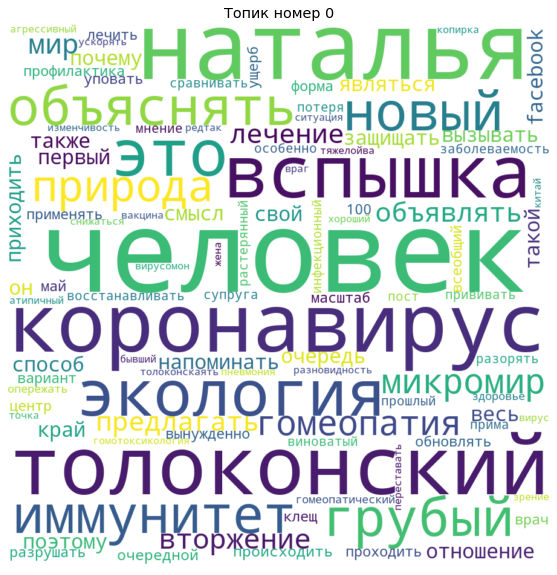

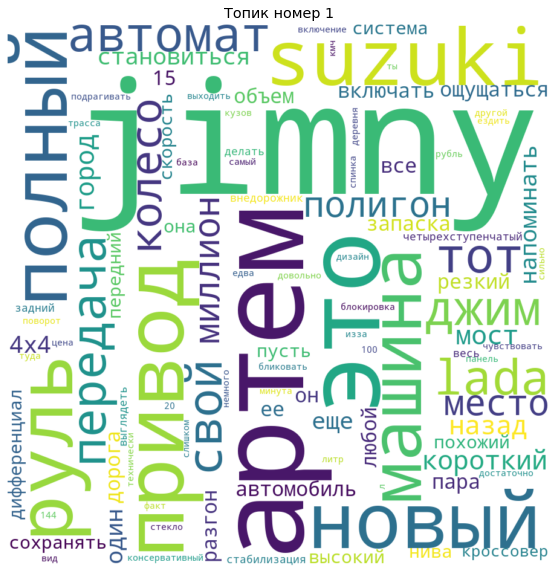

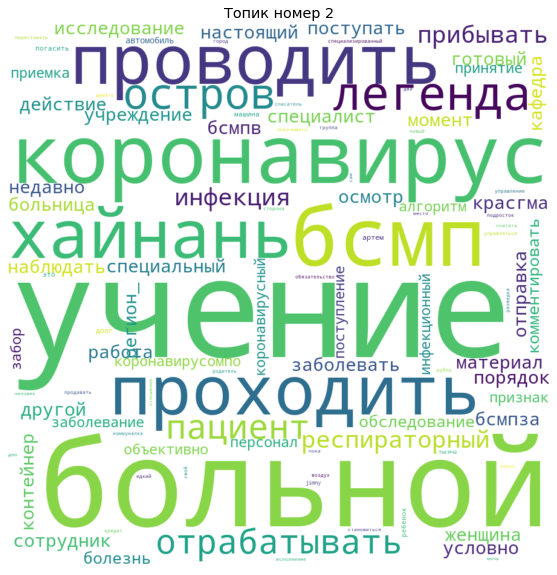

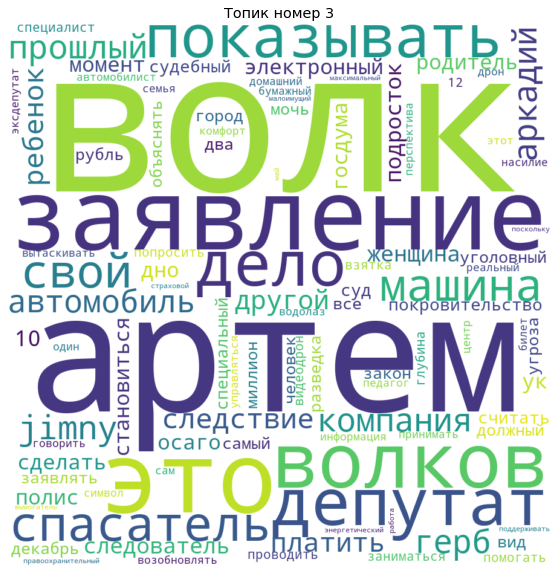

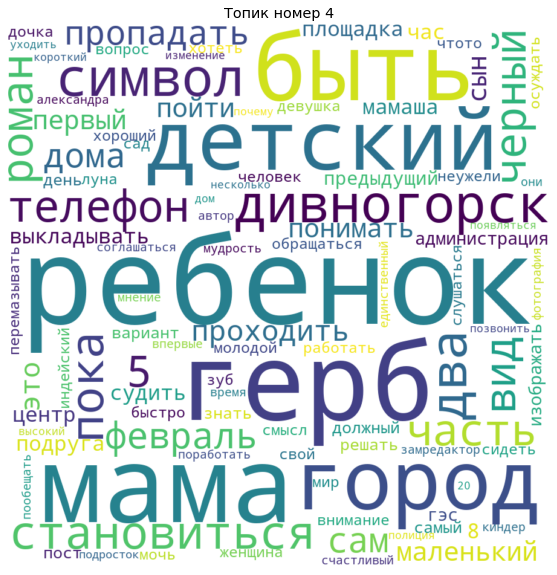

...

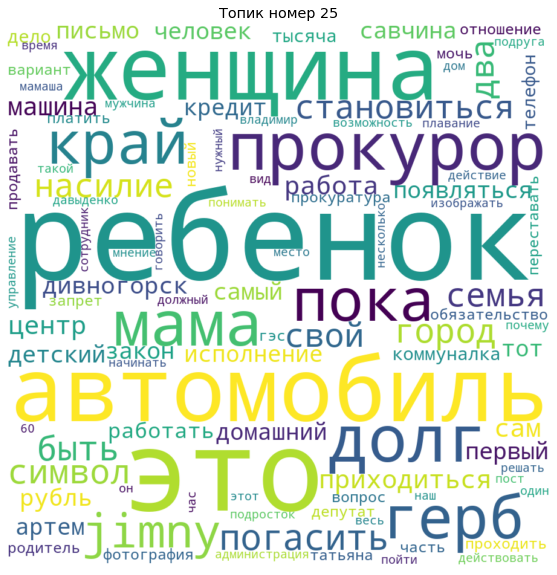

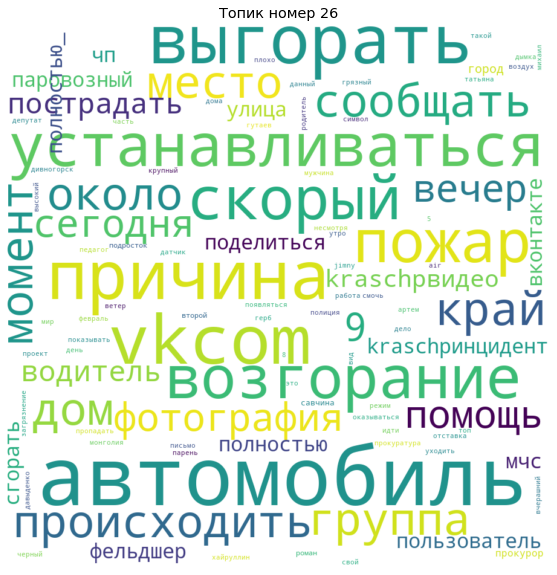

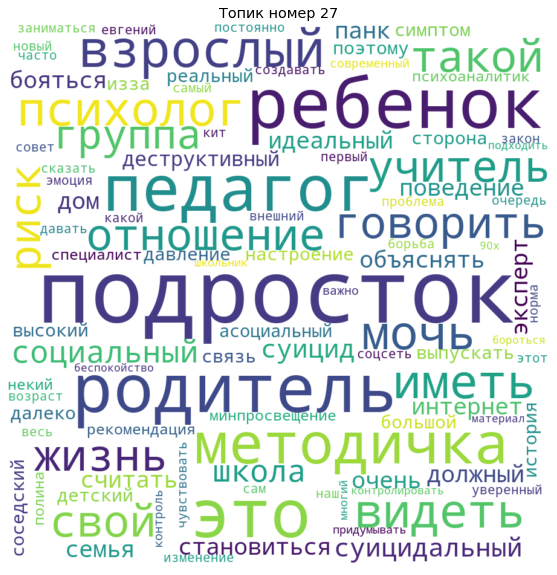

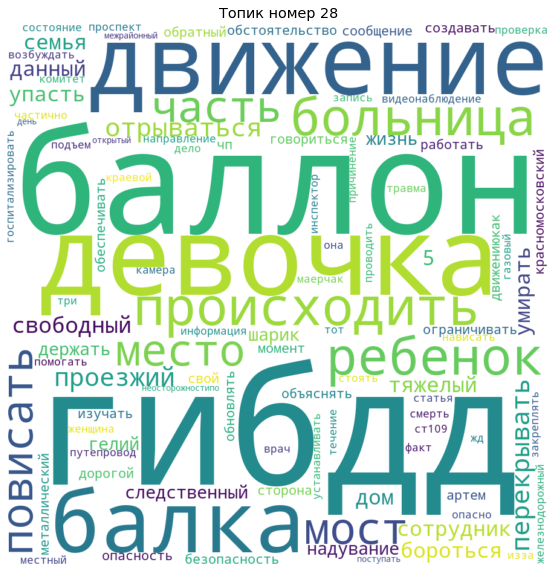

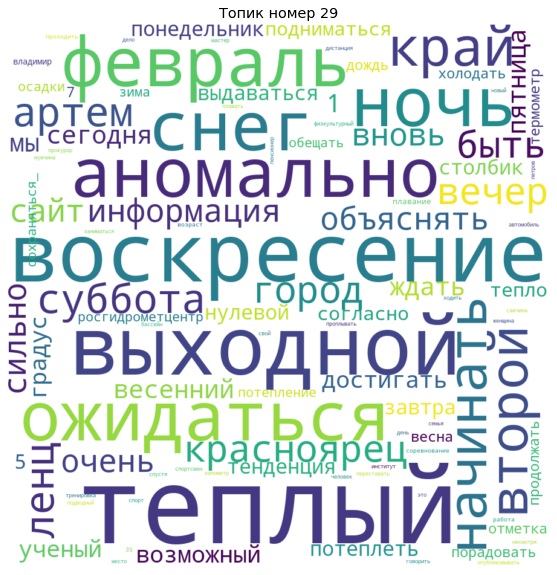

In [5]:
for i in range(30):
    plotWordCloud(topic_number=i)

# интерпретация

In [6]:
themes_30 = {
    0: 'здоровье',
    1: 'автомобиль',
    2: 'коронавирус',
    3: 'непонятно',
    4: 'городские новости',
    5: 'непонятно',
    6: 'cтрахование / ОСАГО',
    7: 'депутат Хайруллин',
    8: 'скандал в прокуратуре',
    9: 'спасатели/ спецоперации',
    10: 'дети',
    11: 'полиция наркотики',
    12: 'следователи',
    13: 'автомобили',
    14: 'дела семейные',
    15: 'спорт',
    16: 'телефонные мошенники',
    17: 'непонятно',
    18: 'непонятно',
    19: 'экология',
    20: 'семья',
    21: 'происшествия',
    22: 'отношения в семье',
    23: 'скандал в прокуратуре',
    24: 'приставы арестовывают имущество',
    25: 'непонятно',
    26: 'проишествия',
    27: 'проблемы подростков',
    28: 'непонятно', 
    29: 'погода'
}

In [7]:
with open('ldamodel_30_bigrams_long_comments', 'rb') as f:
    ldamodel_30 = pickle.load(f)
with open('corpus', 'rb') as f:
    corpus = pickle.load(f)
expElogbeta = np.load("ldamodel_30_bigrams_long_comments.expElogbeta.npy")
ldamodel_30.expElogbeta = expElogbeta
from tqdm import tqdm_notebook

In [8]:
def topicProfileRub(model, rubric, dataset, corpus, genre=True):

    # Тут будем хранить результат
    theme_results = [ ]

    # Какое в модели количество топиков
    r = model.num_topics
    
    # Выбираем из таблицы те строки, которые соовтетствуют текущему жанру
    num = dataset[dataset.rubric == rubric].index.get_values() 
    # Вектор для тематического профиля жанра
    theme_profile = np.zeros(r)
    err = 0 # Для записи ошибок

    # Пробежимся по всем любителям текущего жанра
    for i in num:
        try:
            # вытаскиваем тематический профиль текущего юзера
            cur_user_prof = model.get_document_topics(corpus[i])

            # сортируем по номерам тем
            cur_user_prof = sorted(cur_user_prof, key=lambda w: w[0], reverse=True)      

            ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
            prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
            theme_profile[ind] += prob        # Увеличиваем соответствующие веса
        except:
            err += 1 # Если возникла ошибка, значит профиль битый 
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile

In [9]:
data = pd.read_csv('ngsnews.csv', sep=';')
rubrics = { }
for rs in tqdm_notebook(data.rubric.unique()):
    
    # Выделяем темы для текущего жанра
    rub = topicProfileRub(ldamodel_30, rs, data, corpus)
    
    # Записываем их в словарик:
    rubrics [rs] = rub

In [10]:
def get_interpretable_topics(topics, interpretation):
    topics_clean = {}
    
    for key, value in topics.items():
        clean_topics = []
        clean_probs = []
        for topic, prob in value:
            if themes_30[topic]!="непонятно":
                clean_topics.append(topic)
                clean_probs.append(prob)

        clean_probs = np.array(clean_probs)/np.sum(clean_probs)

        topics_clean[key] = list(zip(clean_topics, clean_probs))
        
    return topics_clean

In [11]:
themes_clean = get_interpretable_topics(rubrics, themes_30)
themes_clusters = {}
for k, v in themes_clean.items():
    themes_clusters[k] = [prob[1] for prob in v]
    
themes_clusters = pd.DataFrame(themes_clusters).T

In [20]:
themes_clusters.fillna(value = 0.0, inplace = True)

In [21]:
themes_clusters

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Город,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.438217,0.0,0.000000,0.0,0.000000,0.219599,0.00000,0.0,0.0
Криминал,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.333119,...,0.333414,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Происшествия,0.0,0.0,0.0,0.166418,0.0,0.16754,0.167155,0.166890,0.0,0.000000,...,0.000000,0.000000,0.0,0.166536,0.0,0.000000,0.000000,0.16546,0.0,0.0
Здоровье Китайский коронавирус,1.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Дороги и транспорт,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,1.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Работа,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.500596,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.499404,0.000000,0.00000,0.0,0.0
Он и она Интервью,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,1.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Здоровье,0.0,0.0,1.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Политика,0.0,0.0,0.0,0.331705,0.0,0.00000,0.334441,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0
Спорт,0.0,0.0,0.0,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.0,0.0


In [44]:
from sklearn.manifold import TSNE
#import chart_studio.plotly as py
from plotly.offline import plot
import plotly.graph_objs as go

tsne = TSNE()
#from MulticoreTSNE import MulticoreTSNE 
#tsne = MulticoreTSNE()
# не смог установить ТСНЕ
tsne_features = tsne.fit_transform(themes_clusters)
trace = go.Scatter(
    x = tsne_features[:, 0],
    y = tsne_features[:, 1],
    mode = 'markers+text',
    text = themes_clusters.index,
    textposition='top center'
)

data = [trace]

layout = go.Layout(
    autosize=False,
    width=700,
    height=700
)

fig = go.Figure(data=data, layout=layout)
fig.show()


Какие-то  равноудаленные реальные рубрики  получились